In [72]:
import os
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import pairwise_distances
from sklearn.cluster import KMeans
import random
from collections import Counter
import matplotlib.pyplot as plt
import time

In [73]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [74]:
folder_path='/content/drive/MyDrive/DMML_Assignment_2'
files = os.listdir(folder_path)
print(files)

['vocab.nips.txt', 'docword.kos.txt', 'readme.txt', 'docword.nips.txt', 'vocab.enron.txt', 'docword.enron.txt', 'vocab.kos.txt']


In [75]:
def create_vocab_dataframe(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
    words = [line.strip() for line in lines]
    word_ids = list(range(1, len(words) + 1))
    vocab_df = pd.DataFrame({'Word': words, 'Word_ID': word_ids})
    return vocab_df
vocab_files = [file for file in files if file.startswith('vocab') and file.endswith('.txt')]
vocab_dfs = {}
for file in vocab_files:
    file_path = os.path.join(folder_path, file)
    vocab_dfs[file] = create_vocab_dataframe(file_path)

In [76]:
def create_docword_lists(file_path):
    docword_lists = []
    with open(file_path, 'r') as file:
        for _ in range(3):
            next(file)
        for line in file:
            doc_id, word_id, _ = map(int, line.strip().split())
            while len(docword_lists) <=doc_id:
                docword_lists.append([])
            docword_lists[doc_id-1].append(word_id)
    return docword_lists

docword_files = [file for file in files if file.startswith('docword') and file.endswith('.txt')]

for file in docword_files:
    file_path = os.path.join(folder_path, file)
    if 'enron' in file:
        docword_lists_enron=create_docword_lists(file_path)
    elif 'nips' in file:
        docword_lists_nips=create_docword_lists(file_path)
    elif 'kos' in file:
        docword_lists_kos=create_docword_lists(file_path)
#docword_lists_enron

In [77]:
def jaccard_distance(doc1,doc2):
  d1 = set(doc1)
  d2 = set(doc2)
  intersection_len = len(d1.intersection(d2))
  union_len = len(d1) + len(d2) - intersection_len
  distance = 1 - (intersection_len / union_len)
  return distance

def initialize_centroids(data, k):
    centroids_idx = random.sample(range(len(data)), k)
    return [data[i] for i in centroids_idx]

def assign_clusters(data, centroids):
    clusters = [[] for _ in range(len(centroids))]
    for doc in data:
        distances = [jaccard_distance(doc, centroid) for centroid in centroids]
        closest_centroid_idx = np.argmin(distances)
        clusters[closest_centroid_idx].append(doc)
    return clusters

def update_centroids(clusters, data):
    new_centroids = []
    for cluster in clusters:
        cluster_docs = [doc for doc in cluster]
        if cluster_docs:
            avg_doc_length = sum(len(doc) for doc in cluster_docs) / len(cluster_docs)
            cluster_words = [word for doc in cluster_docs for word in doc]
            most_common_words = [word for word, _ in Counter(cluster_words).most_common(int(avg_doc_length))]
            new_centroids.append(most_common_words)
        else:
            new_centroids.append([])
    return new_centroids

def k_means(data, k, max_iterations=100, tolerance=0.20):
  centroids = initialize_centroids(data, k)
  avg_jaccard_distances = []
  for _ in range(max_iterations):
      old_centroids = centroids.copy()
      clusters = assign_clusters(data, centroids)
      centroids = update_centroids(clusters, data)

      jaccard_distances = [jaccard_distance(old_centroids[i], centroids[i]) for i in range(k)]
      avg_jaccard_distance = sum(jaccard_distances) / len(jaccard_distances)
      avg_jaccard_distances.append(avg_jaccard_distance)
      if avg_jaccard_distance < tolerance:
          break
  return centroids, clusters

In [78]:
k_means(docword_lists_enron,20)
k_means(docword_lists_nips,20)
k_means(docword_lists_kos,20)

([[2640,
   841,
   2030,
   3420,
   5896,
   5891,
   6662,
   4268,
   2460,
   4735,
   4632,
   6659,
   4635,
   879,
   4736,
   4143,
   4494,
   4247,
   1664,
   4497,
   6296,
   3914,
   4634,
   6299,
   847,
   4941,
   4093,
   4489,
   1666,
   6135,
   4205,
   6785,
   5185,
   6661,
   4442,
   4185,
   2706,
   5186,
   2907,
   6664,
   3282,
   3350,
   3951,
   557,
   6881,
   5571,
   2654,
   4627,
   2275,
   3276,
   4139,
   5244,
   6689,
   512,
   3858,
   4579,
   1173,
   6663,
   3908,
   6061,
   5686,
   3936,
   5051,
   4073,
   4908,
   6880,
   3660,
   3580,
   364,
   500,
   2554,
   5009,
   3534,
   4204,
   2022,
   1980,
   6802,
   3346,
   3422,
   3939,
   2814,
   6705,
   6438,
   1433,
   2403,
   6828,
   2031,
   5100,
   5167,
   3424,
   3696,
   4248,
   4321,
   6887,
   2522,
   2703,
   868,
   6618,
   4196,
   4738,
   453,
   3299,
   6062,
   4414,
   1663,
   3005],
  [3005,
   841,
   5185,
   2031,
   5186,
   1664,
 

In [79]:
def variation(centroids, clusters):
    total_distance=0
    for centroid, cluster in zip(centroids, clusters):
        distances = [jaccard_distance(centroid, point) for point in cluster]
        total_distance += sum(distances)
    return total_distance

def custom_elbow(data, k_values = range(2,20)):
  jaccard_distances = []
  for k in k_values:
    centroids, clusters = k_means(data, k)
    jaccard_distances.append(variation(centroids, clusters))

  plt.plot(k_values, jaccard_distances, marker='o')
  plt.xlabel('Number of Clusters (k)')
  plt.ylabel('Average Jaccard Distance')
  plt.title('Variation of Jaccard Distance vs. Number of Clusters')
  plt.xticks(k_values)
  plt.grid(True)
  plt.show()

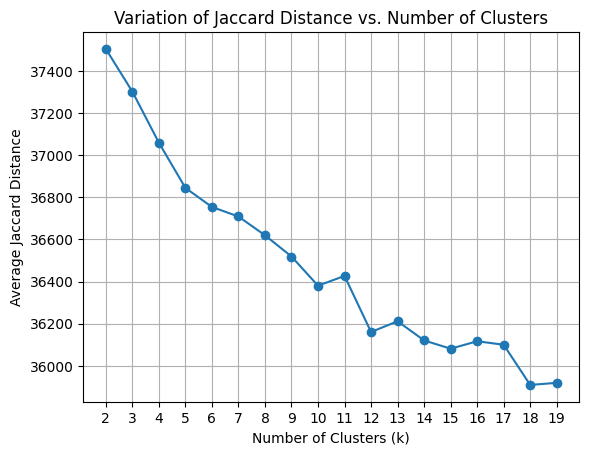

Running time for Enron: 313.5025017261505 seconds


In [80]:
start_time = time.time()

custom_elbow(docword_lists_enron)

end_time = time.time()
running_time = end_time - start_time
print("Running time for Enron:", running_time, "seconds")

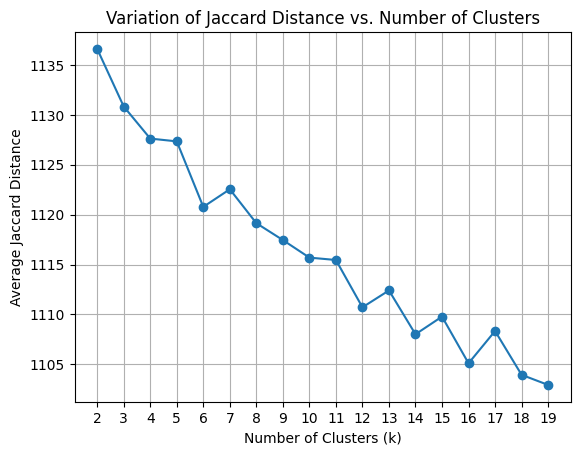

Running time for NIPS: 46.164294958114624 seconds


In [81]:
start_time = time.time()

custom_elbow(docword_lists_nips)

end_time = time.time()
running_time = end_time - start_time
print("Running time for NIPS:", running_time, "seconds")

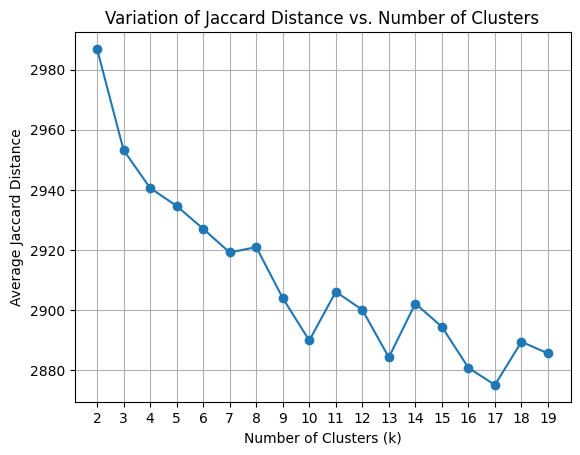

Running time for KOS: 27.363629817962646 seconds


In [82]:
start_time = time.time()

custom_elbow(docword_lists_kos)

end_time = time.time()
running_time = end_time - start_time
print("Running time for KOS:", running_time, "seconds")